In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/predicta-1-0-predict-the-unpredictable/submission_key.csv
/kaggle/input/predicta-1-0-predict-the-unpredictable/sample_submission.csv
/kaggle/input/predicta-1-0-predict-the-unpredictable/historical_weather.csv


In [2]:
historical_weather  = pd.read_csv('/kaggle/input/predicta-1-0-predict-the-unpredictable/historical_weather.csv')
submission_key = pd.read_csv('/kaggle/input/predicta-1-0-predict-the-unpredictable/submission_key.csv')
sample_submission = pd.read_csv('/kaggle/input/predicta-1-0-predict-the-unpredictable/sample_submission.csv')

In [3]:
from datetime import datetime
import numpy as np             #for numerical computations like log,exp,sqrt etc
import matplotlib.pylab as plt #for visualization
#for making sure matplotlib plots are generated in Jupyter notebook itself
%matplotlib inline             
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.stattools import acf, pacf
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.arima_model import ARIMA
from matplotlib.pylab import rcParams
rcParams['figure.figsize'] = 10, 6

In [4]:
historical_weather.head()

,city_id,date,avg_temp_c,min_temp_c,max_temp_c,precipitation_mm,snow_depth_mm,avg_wind_dir_deg,avg_wind_speed_kmh
0,C001,2014-01-01,6.6,-1.4,11.6,NaN,NaN,168.0,6.2
1,C001,2014-01-02,9.3,6.3,13.3,NaN,NaN,155.0,10.0
2,C001,2014-01-03,7.6,1.9,14.0,NaN,NaN,NaN,5.8
3,C001,2014-01-04,7.6,3.9,13.3,NaN,NaN,291.0,11.3
4,C001,2014-01-05,8.6,0.5,16.9,NaN,NaN,NaN,5.0


In [5]:
historical_weather['date'] = pd.to_datetime(historical_weather['date'])

In [6]:
df = historical_weather[['city_id', 'date', 'avg_temp_c']]

In [7]:
df.apply(pd.isnull).sum()/df.shape[0]

city_id       0.000000
date          0.000000
avg_temp_c    0.006713
dtype: float64

<Axes: ylabel='Frequency'>

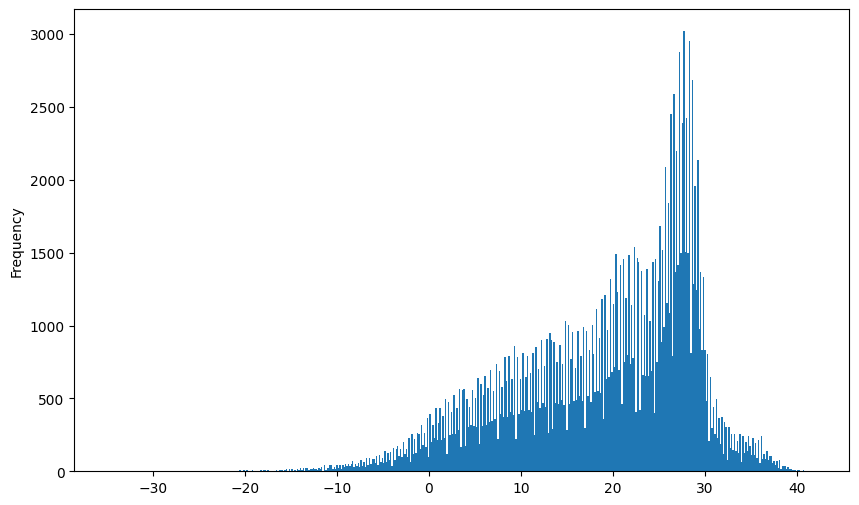

In [8]:
df['avg_temp_c'].plot(kind='hist', bins=500)

In [9]:
df.apply(pd.isnull).sum()

city_id          0
date             0
avg_temp_c    1224
dtype: int64

In [10]:
df.shape[0]

182338

In [11]:
df_cleaned = df.dropna(subset=['avg_temp_c'])

In [12]:
df_cleaned.apply(pd.isnull).sum()

city_id       0
date          0
avg_temp_c    0
dtype: int64

In [13]:
df_cleaned.shape[0]

181114

In [14]:
unique_city_ids = df_cleaned['city_id'].unique()
unique_city_ids

array(['C001', 'C002', 'C003', 'C004', 'C005', 'C007', 'C008', 'C009',
       'C010', 'C011', 'C012', 'C013', 'C014', 'C015', 'C016', 'C017',
       'C018', 'C020', 'C022', 'C023', 'C024', 'C025', 'C027', 'C028',
       'C029', 'C030', 'C031', 'C033', 'C034', 'C035', 'C036', 'C037',
       'C038', 'C039', 'C040', 'C042', 'C043', 'C044', 'C045', 'C046',
       'C047', 'C048', 'C049', 'C051', 'C053', 'C054', 'C055', 'C056',
       'C057', 'C058', 'C059', 'C061', 'C062', 'C064', 'C065', 'C066',
       'C067', 'C068', 'C069', 'C070', 'C071', 'C072', 'C073', 'C074',
       'C076', 'C077', 'C078', 'C079', 'C081', 'C082', 'C083', 'C084',
       'C085', 'C086', 'C087', 'C088', 'C089', 'C090', 'C091', 'C092',
       'C093', 'C094', 'C095', 'C096', 'C097', 'C098', 'C099', 'C100',
       'C101', 'C102', 'C103', 'C104', 'C105', 'C106', 'C107', 'C108',
       'C109', 'C110', 'C111', 'C112'], dtype=object)

/tmp/ipykernel_33/1440235284.py:12: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


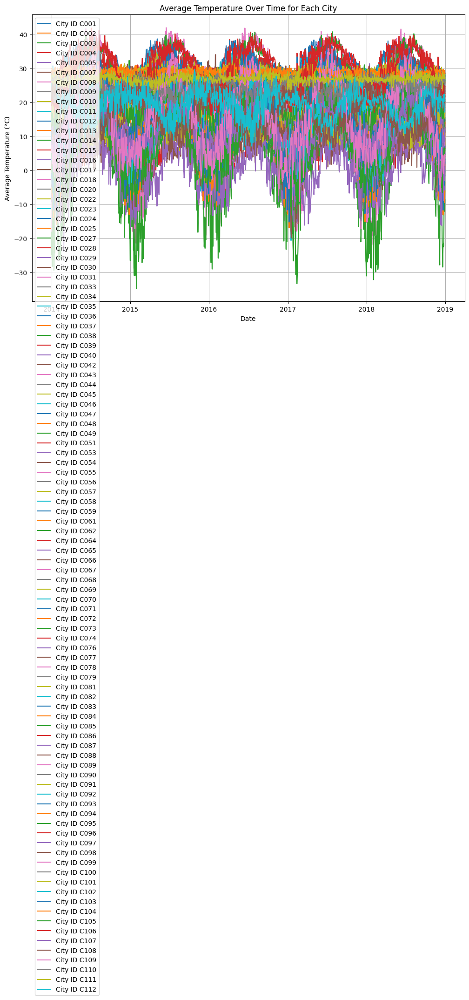

In [16]:
plt.figure(figsize=(12, 8))

for city_id in unique_city_ids:
    city_data = df_cleaned[df_cleaned['city_id'] == city_id]
    plt.plot(city_data['date'], city_data['avg_temp_c'], label=f'City ID {city_id}')

plt.xlabel('Date')
plt.ylabel('Average Temperature (°C)')
plt.title('Average Temperature Over Time for Each City')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [18]:
fig, axs = plt.subplots(len(unique_city_ids), 1, figsize=(12, 6*len(unique_city_ids)), sharex=True)

for i, city_id in enumerate(unique_city_ids):
    city_data = df_cleaned[df_cleaned['city_id'] == city_id]
    axs[i].plot(city_data['date'], city_data['avg_temp_c'])
    axs[i].set_xlabel('Date')
    axs[i].set_ylabel('Average Temperature (°C)')
    axs[i].set_title(f'City ID {city_id}')
    axs[i].grid(True)

# Adjust layout and display
plt.tight_layout()
plt.show()

In [15]:
def create_features(df):
    """
    Create time series features based on time series index.
    """
    df = df.copy()
    df['month'] = df['date'].dt.month
    df['year'] = df['date'].dt.year
    df['dayofyear'] = df['date'].dt.dayofyear
    df['dayofmonth'] = df['date'].dt.day
    df['weekofyear'] = df['date'].dt.isocalendar().week
    return df

df_cleaned['date'] = pd.to_datetime(df_cleaned['date'])
df_cleaned = create_features(df_cleaned)

/tmp/ipykernel_33/4284019214.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cleaned['date'] = pd.to_datetime(df_cleaned['date'])


In [16]:
city_data = {}
for city_id in unique_city_ids:
    city_data[city_id] = df_cleaned[df_cleaned['city_id'] == city_id].copy()

In [17]:
city_data['C001']

,city_id,date,avg_temp_c,month,year,dayofyear,dayofmonth,weekofyear
0,C001,2014-01-01,6.6,1,2014,1,1,1
1,C001,2014-01-02,9.3,1,2014,2,2,1
2,C001,2014-01-03,7.6,1,2014,3,3,1
3,C001,2014-01-04,7.6,1,2014,4,4,1
4,C001,2014-01-05,8.6,1,2014,5,5,1
...,...,...,...,...,...,...,...,...
1821,C001,2018-12-27,9.7,12,2018,361,27,52
1822,C001,2018-12-28,10.1,12,2018,362,28,52
1823,C001,2018-12-29,8.9,12,2018,363,29,52
1824,C001,2018-12-30,10.7,12,2018,364,30,52


In [18]:
def add_lags(df):
    df = df.sort_values(by='date')
    df['lag1'] = df['avg_temp_c'].shift(182)
    df['lag2'] = df['avg_temp_c'].shift(364)
    return df

In [19]:
for city_id in unique_city_ids:
    city_data[city_id] = add_lags(city_data[city_id])

In [20]:
city_data['C001']

,city_id,date,avg_temp_c,month,year,dayofyear,dayofmonth,weekofyear,lag1,lag2
0,C001,2014-01-01,6.6,1,2014,1,1,1,NaN,NaN
1,C001,2014-01-02,9.3,1,2014,2,2,1,NaN,NaN
2,C001,2014-01-03,7.6,1,2014,3,3,1,NaN,NaN
3,C001,2014-01-04,7.6,1,2014,4,4,1,NaN,NaN
4,C001,2014-01-05,8.6,1,2014,5,5,1,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...
1821,C001,2018-12-27,9.7,12,2018,361,27,52,28.8,10.4
1822,C001,2018-12-28,10.1,12,2018,362,28,52,28.4,9.3
1823,C001,2018-12-29,8.9,12,2018,363,29,52,27.8,9.9
1824,C001,2018-12-30,10.7,12,2018,364,30,52,27.9,7.7


In [24]:
from xgboost import XGBRegressor
from sklearn.metrics import mean_squared_error

city_models = {}

for city_id in unique_city_ids:
    train = city_data[city_id].loc[city_data[city_id]['date'] < '01-01-2018']
    test = city_data[city_id].loc[city_data[city_id]['date'] >= '01-01-2018']
    
    FEATURES = ['month', 'year', 'dayofyear', 'dayofmonth', 'weekofyear', 'lag1', 'lag2']
    TARGET = 'avg_temp_c'
    
    X_train = train[FEATURES]
    y_train = train[TARGET]

    X_test = test[FEATURES]
    y_test = test[TARGET]
    
    model = XGBRegressor(objective='reg:squarederror', n_estimators=1000, learning_rate=0.01)
    model.fit(X_train, y_train)
    
    y_pred = model.predict(X_test)

    mse = mean_squared_error(y_test, y_pred)
    print(f'Mean Squared Error: {mse}')
    
    city_models[city_id] = model

Mean Squared Error: 11.114539049107302
Mean Squared Error: 6.192316929868162
Mean Squared Error: 1.8787957630824155
Mean Squared Error: 17.51785773045583
Mean Squared Error: 8.140390940473482
Mean Squared Error: 8.52124239007717
Mean Squared Error: 12.849989036102029
Mean Squared Error: 4.398315210153198
Mean Squared Error: 2.3367947129233975
Mean Squared Error: 22.454175686142385
Mean Squared Error: 13.668104605539801
Mean Squared Error: 18.14515972611173
Mean Squared Error: 12.871719347516303
Mean Squared Error: 3.7487031974282603
Mean Squared Error: 1.8166339775882951
Mean Squared Error: 2.2173154892904967
Mean Squared Error: 26.6806880329406
Mean Squared Error: 2.8108095758522347
Mean Squared Error: 13.11134730582639
Mean Squared Error: 4.357410093078245
Mean Squared Error: 14.065660981033504
Mean Squared Error: 16.07836866409587
Mean Squared Error: 60.11061061243516
Mean Squared Error: 1.4813698994636397
Mean Squared Error: 1.9334168690199707
Mean Squared Error: 0.515992547443512


In [23]:
from sklearn.linear_model import Ridge

for city_id in unique_city_ids:
    train = city_data[city_id].loc[city_data[city_id]['date'] < '01-01-2018']
    test = city_data[city_id].loc[city_data[city_id]['date'] >= '01-01-2018']
    
    FEATURES = ['month', 'year', 'dayofyear', 'dayofmonth', 'weekofyear']
    TARGET = 'avg_temp_c'
    
    X_train = train[FEATURES]
    y_train = train[TARGET]

    X_test = test[FEATURES]
    y_test = test[TARGET]
    
    reg = Ridge(alpha=.1)
    reg.fit(X_train, y_train)
    
    y_pred = reg.predict(X_test)

    mse = mean_squared_error(y_test, y_pred)
    print(f'Mean Squared Error: {mse}')
    
    city_models[city_id] = model

Mean Squared Error: 41.26387987747666
Mean Squared Error: 22.04260762996424
Mean Squared Error: 4.964959665378194
Mean Squared Error: 56.75554125500353
Mean Squared Error: 23.94421034990412
Mean Squared Error: 22.64506079081831
Mean Squared Error: 50.53123813009108
Mean Squared Error: 29.622204658950764
Mean Squared Error: 11.507952066827729
Mean Squared Error: 64.34980298224713
Mean Squared Error: 34.139446427408956
Mean Squared Error: 52.969887293475814
Mean Squared Error: 53.04666752975491
Mean Squared Error: 8.789063503371992
Mean Squared Error: 1.998934341374775
Mean Squared Error: 1.7618292224512353
Mean Squared Error: 107.68888345061521
Mean Squared Error: 3.844399613760585
Mean Squared Error: 106.5768496505033
Mean Squared Error: 4.5747079297830044
Mean Squared Error: 56.00225646292437
Mean Squared Error: 49.813790250560714
Mean Squared Error: 188.59595932793383
Mean Squared Error: 2.731304059249286
Mean Squared Error: 3.478409410277303
Mean Squared Error: 1.0942368294768539
Me

In [25]:
submission_key['date'] = pd.to_datetime(submission_key['date'])
submission_key = create_features(submission_key)
predicted_values = []

for city_id in unique_city_ids:
    city_data_subset = city_data[city_id]
    submission_key_subset = submission_key[submission_key['city_id'] == city_id].copy()
    concatenated_data = pd.concat([city_data_subset, submission_key_subset], ignore_index=True)
    concatenated_data = add_lags(concatenated_data)
    test = concatenated_data.loc[concatenated_data['date'] >= '01-01-2019'][FEATURES]
    predicted_values_subset = city_models[city_id].predict(test)
    predicted_values.extend(predicted_values_subset)

In [27]:
len(predicted_values)

700

In [30]:
sample_submission.head()

,submission_ID,avg_temp_c
0,1,NaN
1,2,NaN
2,3,NaN
3,4,NaN
4,5,NaN


In [31]:
sample_submission['avg_temp_c'] = predicted_values
sample_submission.head()

,submission_ID,avg_temp_c
0,1,9.316720
1,2,9.265638
2,3,9.200546
3,4,7.565633
4,5,7.115868


In [32]:
sample_submission.to_csv('updated_sample_submission_2.csv', index=False)

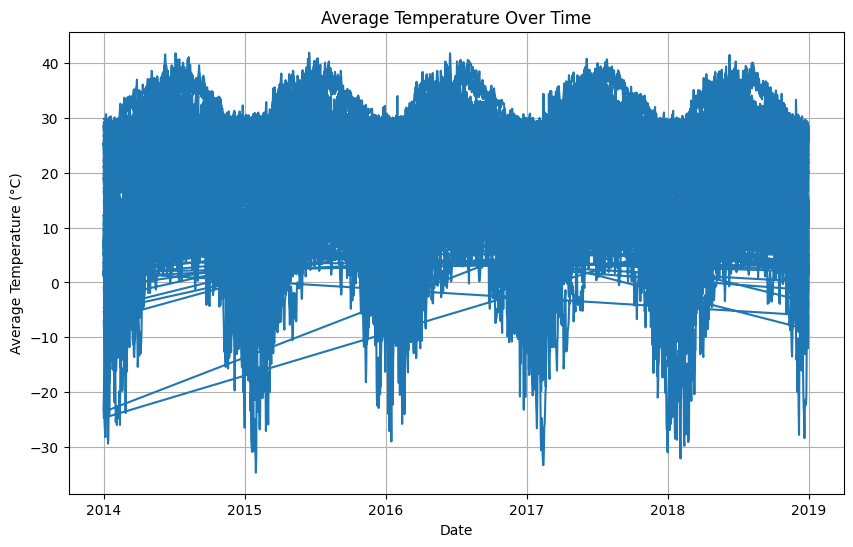

In [14]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.plot(df_cleaned['date'], df_cleaned['avg_temp_c'])
plt.xlabel('Date')
plt.ylabel('Average Temperature (°C)')
plt.title('Average Temperature Over Time')
plt.grid(True)
plt.show()

<Axes: ylabel='Frequency'>

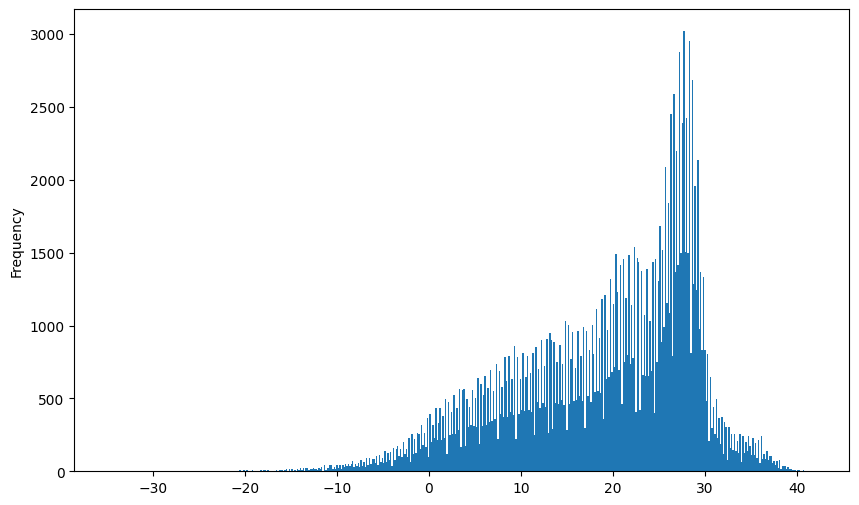

In [15]:
df_cleaned['avg_temp_c'].plot(kind='hist', bins=500)

In [16]:
city_mean_temp = df_cleaned.groupby('city_id')['avg_temp_c'].mean()
city_mean_dict = city_mean_temp.to_dict()
df_cleaned['city_id_encoded'] = df_cleaned['city_id'].map(city_mean_dict)
df_cleaned.drop(columns=['city_id'], inplace=True)

/tmp/ipykernel_34/2817675479.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cleaned['city_id_encoded'] = df_cleaned['city_id'].map(city_mean_dict)
/tmp/ipykernel_34/2817675479.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cleaned.drop(columns=['city_id'], inplace=True)


In [17]:
df_cleaned.head()

,date,avg_temp_c,city_id_encoded
0,2014-01-01,6.6,16.298905
1,2014-01-02,9.3,16.298905
2,2014-01-03,7.6,16.298905
3,2014-01-04,7.6,16.298905
4,2014-01-05,8.6,16.298905


In [18]:
city_mean_dict

{'C001': 16.298904709748083,
 'C002': 19.910648918469217,
 'C003': 25.68030718595721,
 'C004': 5.833643835616438,
 'C005': 18.149452354874043,
 'C007': 13.420821917808219,
 'C008': 12.125355969331874,
 'C009': 28.35060240963855,
 'C010': 26.418836565096953,
 'C011': 7.892004381161008,
 'C012': 11.71914426769062,
 'C013': 11.744578313253012,
 'C014': 11.379682365826945,
 'C015': 29.07064622124863,
 'C016': 20.93141447368421,
 'C017': 28.828751369112815,
 'C018': 7.025179458862507,
 'C020': 26.522179627601314,
 'C022': 13.176615553121577,
 'C023': 26.843263964950715,
 'C024': 14.155366922234393,
 'C025': 10.692814042786615,
 'C027': 2.8194891726818434,
 'C028': 26.960679079956186,
 'C029': 25.920904578047434,
 'C030': 26.83263964950712,
 'C031': 7.388335158817087,
 'C033': 7.5273176083379045,
 'C034': 12.97015334063527,
 'C035': 26.914841182913474,
 'C036': 13.402464403066814,
 'C037': 11.477437020810514,
 'C038': 27.651095290251916,
 'C039': 19.315443592552025,
 'C040': 27.5241169977924

In [20]:
def add_lags(df):
    df = df.sort_values(by='date')
    df['lag1'] = df['avg_temp_c'].shift()
    df['lag2'] = df['avg_temp_c'].shift(2)
    df['lag3'] = df['avg_temp_c'].shift(3)
    return df

df_cleaned = df_cleaned.groupby('city_id_encoded', group_keys=False).apply(add_lags)

/tmp/ipykernel_34/1004840756.py:8: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df_cleaned = df_cleaned.groupby('city_id_encoded', group_keys=False).apply(add_lags)


In [21]:
train = df_cleaned.loc[df_cleaned['date'] < '01-01-2018']
test = df_cleaned.loc[df_cleaned['date'] >= '01-01-2018']

In [22]:
train

,date,avg_temp_c,city_id_encoded,month,year,dayofyear,dayofmonth,weekofyear,lag1,lag2,lag3
80227,2014-01-01,-6.9,0.132913,1,2014,1,1,1,NaN,NaN,NaN
80228,2014-01-02,-9.3,0.132913,1,2014,2,2,1,-6.9,NaN,NaN
80229,2014-01-03,-4.7,0.132913,1,2014,3,3,1,-9.3,-6.9,NaN
80230,2014-01-04,-2.9,0.132913,1,2014,4,4,1,-4.7,-9.3,-6.9
80231,2014-01-05,-1.8,0.132913,1,2014,5,5,1,-2.9,-4.7,-9.3
...,...,...,...,...,...,...,...,...,...,...,...
110850,2017-12-27,25.6,30.378806,12,2017,361,27,52,25.8,26.7,25.5
110851,2017-12-28,25.2,30.378806,12,2017,362,28,52,25.6,25.8,26.7
110852,2017-12-29,25.5,30.378806,12,2017,363,29,52,25.2,25.6,25.8
110853,2017-12-30,24.8,30.378806,12,2017,364,30,52,25.5,25.2,25.6


In [23]:
from xgboost import XGBRegressor
from sklearn.metrics import mean_squared_error

fold = 0
preds = []
scores = []

FEATURES = ['city_id_encoded', 'month', 'year', 'dayofyear', 'dayofmonth', 'weekofyear', 'lag1', 'lag2', 'lag3']
TARGET = 'avg_temp_c'

X_train = train[FEATURES]
y_train = train[TARGET]

X_test = test[FEATURES]
y_test = test[TARGET]

reg = xgb.XGBRegressor(base_score=0.5, booster='gbtree',    
                       n_estimators=1000,
                       early_stopping_rounds=50,
                       objective='reg:linear',
                       max_depth=3,
                       learning_rate=0.01)
reg.fit(X_train, y_train,
        eval_set=[(X_train, y_train), (X_test, y_test)],
        verbose=100)

y_pred = reg.predict(X_test)
preds.append(y_pred)
score = np.sqrt(mean_squared_error(y_test, y_pred))
scores.append(score)

[0]	validation_0-rmse:20.91353	validation_1-rmse:20.83049


/opt/conda/lib/python3.10/site-packages/xgboost/core.py:160: UserWarning: [09:41:03] WARNING: /workspace/src/objective/regression_obj.cu:209: reg:linear is now deprecated in favor of reg:squarederror.
  warnings.warn(smsg, UserWarning)


[100]	validation_0-rmse:7.91959	validation_1-rmse:7.87013
[200]	validation_0-rmse:3.42717	validation_1-rmse:3.37922
[300]	validation_0-rmse:2.17507	validation_1-rmse:2.12003
[400]	validation_0-rmse:1.91623	validation_1-rmse:1.86572
[500]	validation_0-rmse:1.86646	validation_1-rmse:1.81889
[600]	validation_0-rmse:1.85146	validation_1-rmse:1.80358
[700]	validation_0-rmse:1.84349	validation_1-rmse:1.79725
[800]	validation_0-rmse:1.83789	validation_1-rmse:1.79346
[900]	validation_0-rmse:1.83318	validation_1-rmse:1.79034
[999]	validation_0-rmse:1.82886	validation_1-rmse:1.78765


In [24]:
print(f'Score across folds {np.mean(scores):0.4f}')
print(f'Fold scores:{scores}')

Score across folds 1.7877
Fold scores:[1.7876526188911388]


In [25]:
submission_key['date'] = pd.to_datetime(submission_key['date'])
submission_key['city_id_encoded'] = submission_key['city_id'].map(city_mean_dict)

In [26]:
submission_key = create_features(submission_key)
submission_key.drop(columns=['city_id'], inplace=True)
submission_key

,submission_ID,date,city_id_encoded,month,year,dayofyear,dayofmonth,weekofyear
0,1,2019-01-01,16.298905,1,2019,1,1,1
1,2,2019-01-02,16.298905,1,2019,2,2,1
2,3,2019-01-03,16.298905,1,2019,3,3,1
3,4,2019-01-04,16.298905,1,2019,4,4,1
4,5,2019-01-05,16.298905,1,2019,5,5,1
...,...,...,...,...,...,...,...,...
695,696,2019-01-03,19.257222,1,2019,3,3,1
696,697,2019-01-04,19.257222,1,2019,4,4,1
697,698,2019-01-05,19.257222,1,2019,5,5,1
698,699,2019-01-06,19.257222,1,2019,6,6,1


In [27]:
df_cleaned['isFuture'] = False
submission_key['isFuture'] = True

In [28]:
df_and_future = pd.concat([df_cleaned, submission_key])

In [29]:
df_and_future

,date,avg_temp_c,city_id_encoded,month,year,dayofyear,dayofmonth,weekofyear,lag1,lag2,lag3,isFuture,submission_ID
80227,2014-01-01,-6.9,0.132913,1,2014,1,1,1,NaN,NaN,NaN,False,NaN
80228,2014-01-02,-9.3,0.132913,1,2014,2,2,1,-6.9,NaN,NaN,False,NaN
80229,2014-01-03,-4.7,0.132913,1,2014,3,3,1,-9.3,-6.9,NaN,False,NaN
80230,2014-01-04,-2.9,0.132913,1,2014,4,4,1,-4.7,-9.3,-6.9,False,NaN
80231,2014-01-05,-1.8,0.132913,1,2014,5,5,1,-2.9,-4.7,-9.3,False,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...
695,2019-01-03,NaN,19.257222,1,2019,3,3,1,NaN,NaN,NaN,True,696.0
696,2019-01-04,NaN,19.257222,1,2019,4,4,1,NaN,NaN,NaN,True,697.0
697,2019-01-05,NaN,19.257222,1,2019,5,5,1,NaN,NaN,NaN,True,698.0
698,2019-01-06,NaN,19.257222,1,2019,6,6,1,NaN,NaN,NaN,True,699.0


In [31]:
df_and_future = add_lags(df_and_future)
df_and_future

,date,avg_temp_c,city_id_encoded,month,year,dayofyear,dayofmonth,weekofyear,lag1,lag2,lag3,isFuture,submission_ID
80227,2014-01-01,-6.9,0.132913,1,2014,1,1,1,NaN,NaN,NaN,False,NaN
138584,2014-01-01,24.9,28.008817,1,2014,1,1,1,-6.9,NaN,NaN,False,NaN
10929,2014-01-01,5.1,12.125356,1,2014,1,1,1,24.9,-6.9,NaN,False,NaN
71098,2014-01-01,9.6,18.938082,1,2014,1,1,1,5.1,24.9,-6.9,False,NaN
41915,2014-01-01,24.4,26.960679,1,2014,1,1,1,9.6,5.1,24.9,False,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...
335,2019-01-07,NaN,14.090553,1,2019,7,7,2,NaN,NaN,NaN,True,336.0
342,2019-01-07,NaN,18.999452,1,2019,7,7,2,NaN,NaN,NaN,True,343.0
349,2019-01-07,NaN,28.065936,1,2019,7,7,2,NaN,NaN,NaN,True,350.0
188,2019-01-07,NaN,7.388335,1,2019,7,7,2,NaN,NaN,NaN,True,189.0


In [32]:
X_submission = df_and_future[FEATURES]

In [46]:
y_submission = reg.predict(X_submission)

In [47]:
y_submission


array([-6.7133665, -2.9045348, 22.020197 , ..., 22.234724 ,  2.066856 ,
       16.772415 ], dtype=float32)

In [48]:
y_submission_pred = y_submission[df_cleaned.size::]

In [50]:
y_submission_pred

array([], dtype=float32)

In [32]:
sample_submission['avg_temp_c'] = y_submission

In [33]:
sample_submission

,submission_ID,avg_temp_c
0,1,8.572224
1,2,8.572224
2,3,8.572224
3,4,8.572224
4,5,8.572224
...,...,...
695,696,15.409547
696,697,15.409547
697,698,15.409547
698,699,15.409547


In [34]:
sample_submission.to_csv('updated_sample_submission.csv', index=False)